# DB_HW3 Группировка данных и оконные функции (vo_HW)

Выполнил: Самородов Юрий Сергеевич

## Предварительные данные

In [ ]:
import pandas as pd

df_transaction_hw2 = pd.read_csv('transaction_tsv_clear_hw2.txt', sep='\t')
df_customer_hw2 = pd.read_csv('customer_hw2.csv', sep=";" )
df_customer_hw3 = pd.read_csv('customer_hw3.csv', sep=";")
df_transaction_hw3 = pd.read_csv('transaction_hw3.csv', sep=';')

In [ ]:
df_customer_hw2.info() ;

![CleanShot 2025-03-02 at 00.52.14.png](<attachment:CleanShot 2025-03-02 at 00.52.14.png>)
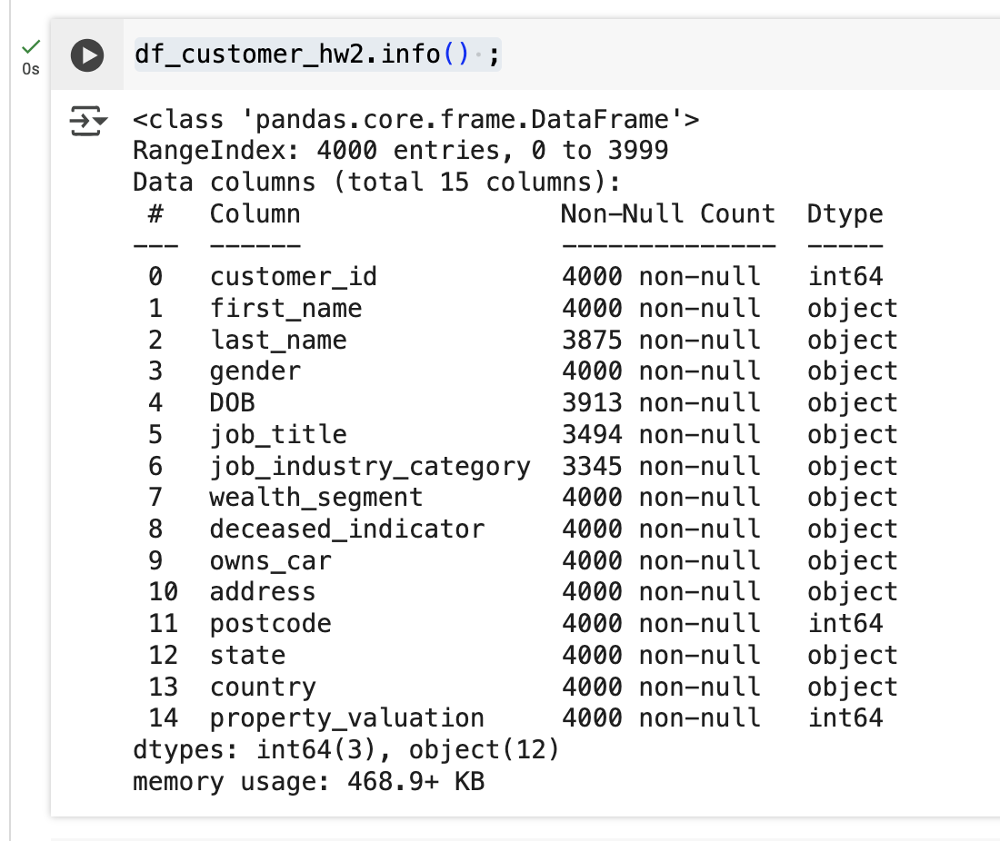

In [ ]:
df_customer_hw3.info()

![CleanShot 2025-03-02 at 00.53.19.png](<attachment:CleanShot 2025-03-02 at 00.53.19.png>)
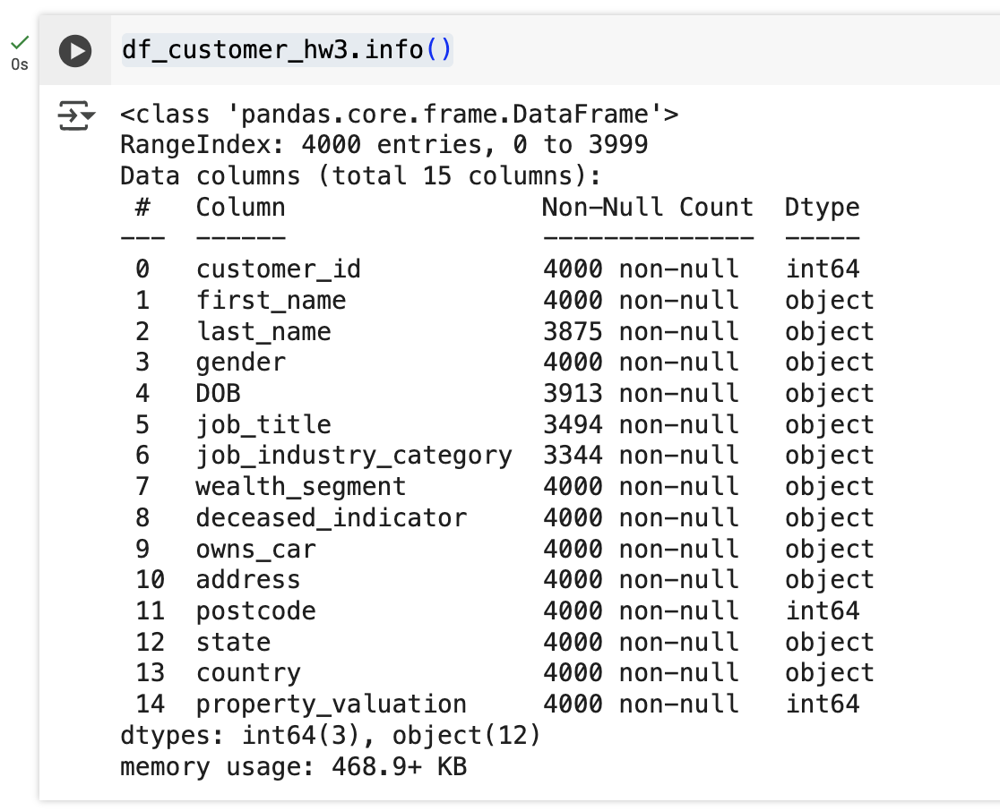

In [ ]:
customer_diff = df_customer_hw2.compare(df_customer_hw3)
customer_diff

![CleanShot 2025-03-02 at 00.27.13.png](<attachment:CleanShot 2025-03-02 at 00.27.13.png>)
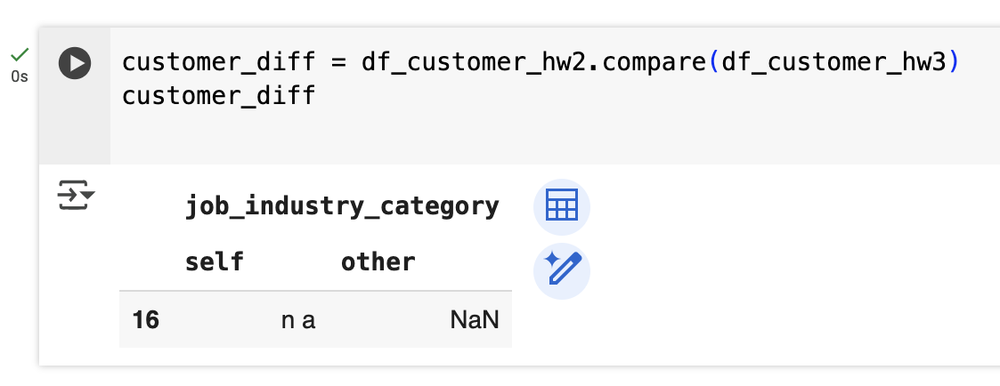

In [ ]:
df_transaction_hw2.info()

![CleanShot 2025-03-02 at 00.54.04.png](<attachment:CleanShot 2025-03-02 at 00.54.04.png>)
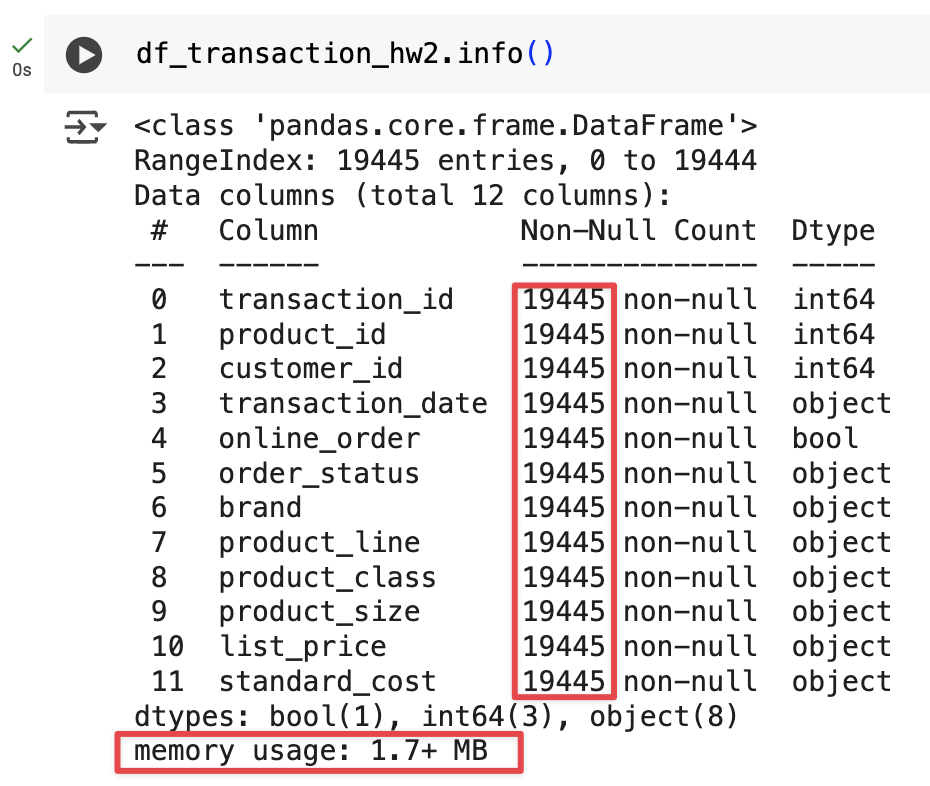

In [ ]:
df_transaction_hw3.info()

![CleanShot 2025-03-02 at 00.54.46.png](<attachment:CleanShot 2025-03-02 at 00.54.46.png>)
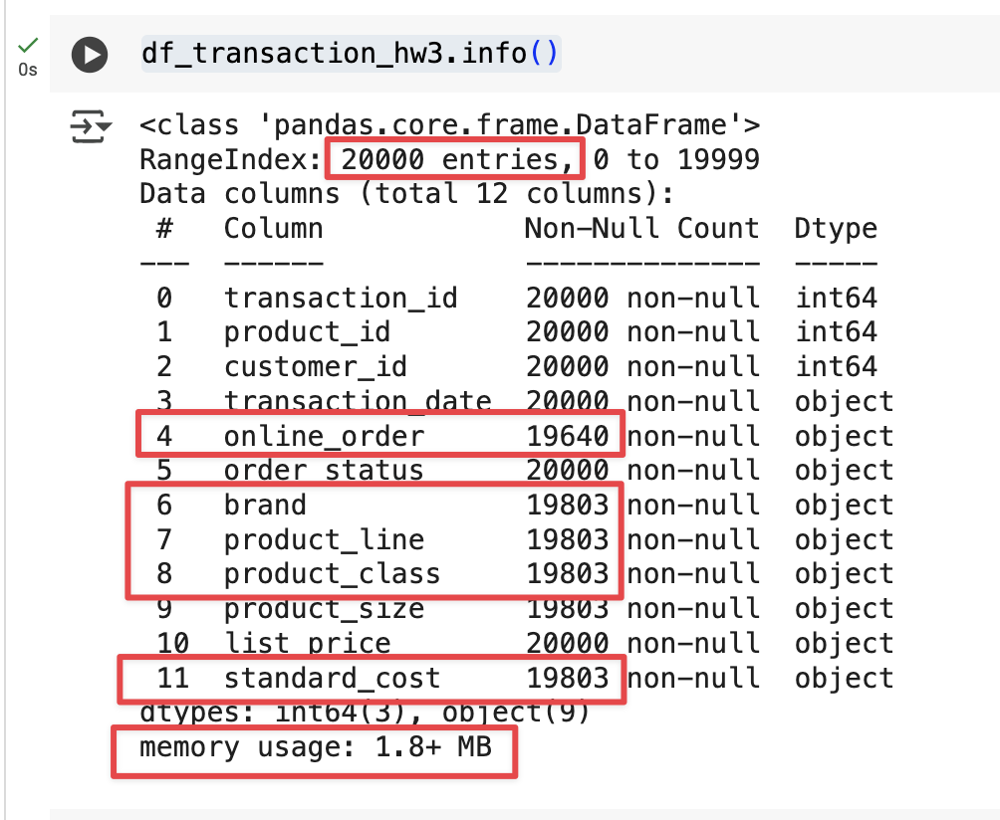

In [ ]:
duplicate_customer_ids = df_customer_hw2[df_customer_hw2.duplicated(subset=['customer_id'], keep=False)]
duplicate_customer_ids.count()

![CleanShot 2025-03-02 at 01.06.35.png](<attachment:CleanShot 2025-03-02 at 01.06.35.png>)
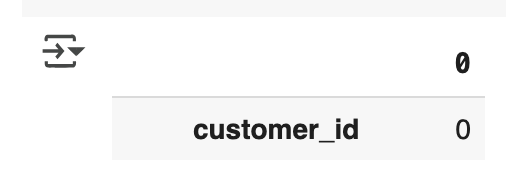

In [ ]:
duplicate_transaction_id = df_transaction_hw3[df_transaction_hw3.duplicated(subset=['transaction_id'], keep=False)]
duplicate_transaction_id.count()

![CleanShot 2025-03-02 at 01.06.59.png](<attachment:CleanShot 2025-03-02 at 01.06.59.png>)
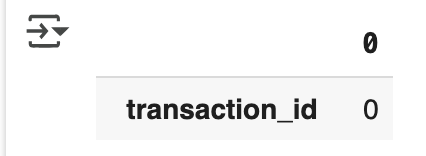

**Выявлены следующие факты о файлах:**

* Условия совпадают с предыдущей домашней работой.
* Набор полей и требуемые типы данных в файлах тоже не отличаются от ДЗ №2
* Количество строк в файлах customer.csv не отличается. Формат даты также не отличается. Есть небольшие отличия в данных (например, в поле `job_industry_category` в файле из ДЗ №2 стоят "n a" или даже "n/a", тогда как в customer.csv из ДЗ №3 указаны пустые значения - NaN)
* Количество строк в  файлах transaction.csv из ДЗ №2 - 19945. Пустые значения отстутствуют. Такой же файл из ДЗ №3 содержит ровно 20000 строк,  однако количество строк без NaN - 19640
* Дубликаты в `customer_id` не найдены
* Дубликаты в `transaction_id` не найдены


**Вывод**

Поскольку данные в большей своей части совпадают, будем использовать данные, которые мы уже загружали в ДЗ №2

## Подготвка данных

Еще раз обратим внимание, что для поля `dob` таблицы Customer почему-то выбран тип VARCHAR, хотя логичнее было использовать DATE
Также был смысл вместо VARCHAR в полях `deceased_indicator` и `owns_car` использовать тип данных boolean для экономии памяти (boolean занимает всего 1 байт, тогда как VARCHAR(30) заберет 30 байт)

### Создание таблицы для клиентов


In [ ]:
CREATE TABLE customer (
    customer_id INT PRIMARY KEY,
    first_name VARCHAR(50),
    last_name VARCHAR(50),
    gender VARCHAR(30),
    dob VARCHAR(50),
    job_title VARCHAR(50),
    job_industry_category VARCHAR(50),
    wealth_segment VARCHAR(50),
    deceased_indicator VARCHAR(50),
    owns_car VARCHAR(30),
    address VARCHAR(50),
    postcode VARCHAR(30),
    state VARCHAR(30),
    country VARCHAR(30),
    property_valuation INT
);


### Создание таблицы для транзакций


Обратим внимание на поле `transaction_date`. Его тоже логично хранить в виде DATE, чтобы в запросах постоянно не конвертировать из VARCHAR в DATE
Также, `online_order` имеет смысл хранить в виде Boolean для экономии памяти.
Вероятно, точно так же получится и с `order_status`, но только в том случае, если у статуса не более двух состояний. В противном случае, стоит это поле преобразовать в отдельную таблицу, а в связанных таблицах указывать только индекс.

In [ ]:
CREATE TABLE transaction (
    transaction_id INT PRIMARY KEY,
    product_id INT,
    customer_id INT,
    transaction_date VARCHAR(30),
    online_order VARCHAR(30),
    order_status VARCHAR(30),
    brand VARCHAR(30),
    product_line VARCHAR(30),
    product_class VARCHAR(30),
    product_size VARCHAR(30),
    list_price FLOAT4,
    standard_cost FLOAT4
);

### Загрузка данных в таблицы


#### customer

In [ ]:
-- Импортируем данные
	-- в таблицу customer
		COPY customer
		FROM '/Users/yuriy.samorodov/Documents/МФТИ/Семестр 2/Системы Хранения Данных/HW_2/customer.csv' 
		DELIMITER ';' 
		CSV HEADER;

#### transaction

In [ ]:
-- в таблицу transaction

/*
float(4) aka real требует точку в качестве разделителя.
Потому нужно либо поменять тип полей list_price и standrard_cost с FLOAT4 (REAL) на NUMERIC или DECIMAL,
но это не удовлетворяет условиям задачи
Либо поменять разделитель прямо в файле, но это неинтересно, так как изменит датасет.
Либо, нужна кастомная функция для преобразования запятых в точки, 
но она требует создания временной таблицы
Поэтому будем импортировать при помощи sed с заменой запятых на точки в режиме реального времени
*/

/*
    * Строки, где standard_price - пустое значение удалил, так как нулевой себестоимоси быть не может
    * Строки, где online_order - пустое значение так же удалил, так как невозможно определить тип транзакции по другим полям
    * Разделитель в новом файле transaction_cleared - запятая (отличается от оригинального файла)
    * 	 
    */

    COPY transaction
    FROM PROGRAM 'sed ''s/,/\./g'' ''/Users/yuriy.samorodov/Documents/МФТИ/Семестр 2/Системы Хранения Данных/HW_2/transaction_csv_clear.csv'''
    WITH (FORMAT csv, DELIMITER ';',  header);

## Задачи и решения

### 1. Вывести распределение (количество) клиентов по сферам деятельности, отсортировав результат по убыванию количества. — (1 балл)


In [ ]:
SELECT job_industry_category, COUNT(*) AS customer_count
FROM customer
GROUP BY job_industry_category
ORDER BY customer_count DESC;

![CleanShot 2025-03-02 at 01.41.40.png](<attachment:CleanShot 2025-03-02 at 01.41.40.png>)
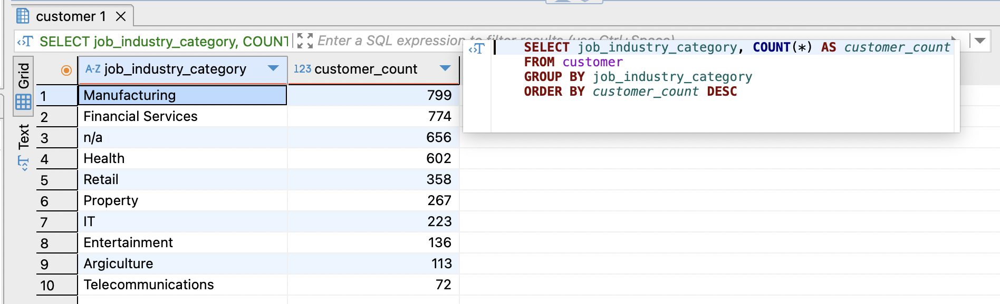

### 2. Найти сумму транзакций за каждый месяц по сферам деятельности, отсортировав по месяцам и по сфере деятельности. — (1 балл)


In [ ]:
SELECT 
    TO_CHAR(TO_DATE(transaction_date, 'DD.MM.YYYY'), 'YYYY-MM') AS month,
    c.job_industry_category,
    SUM(t.list_price) AS total_transactions
FROM transaction t
JOIN customer c ON t.customer_id = c.customer_id
GROUP BY month, c.job_industry_category
ORDER BY month, c.job_industry_category;

![CleanShot 2025-03-02 at 01.45.11.png](<attachment:CleanShot 2025-03-02 at 01.45.11.png>)
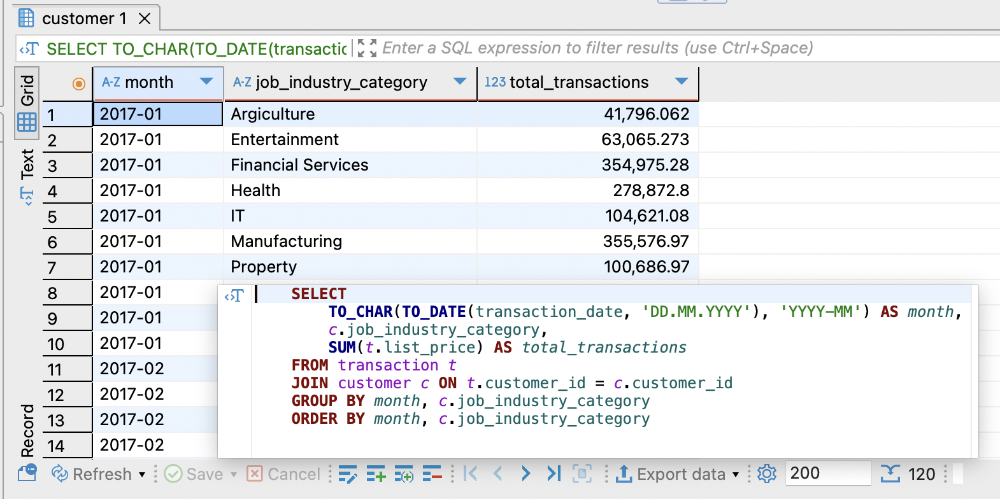

### 3. Вывести количество онлайн-заказов для всех брендов в рамках подтвержденных заказов клиентов из сферы IT. — (1 балл)


In [ ]:
SELECT 
    t.brand,
    COUNT(*) AS online_order_count
FROM transaction t
JOIN customer c ON t.customer_id = c.customer_id
WHERE c.job_industry_category = 'IT' AND t.order_status = 'Approved' AND t.online_order = 'TRUE'
GROUP BY t.brand;

![CleanShot 2025-03-02 at 01.50.43.png](<attachment:CleanShot 2025-03-02 at 01.50.43.png>)
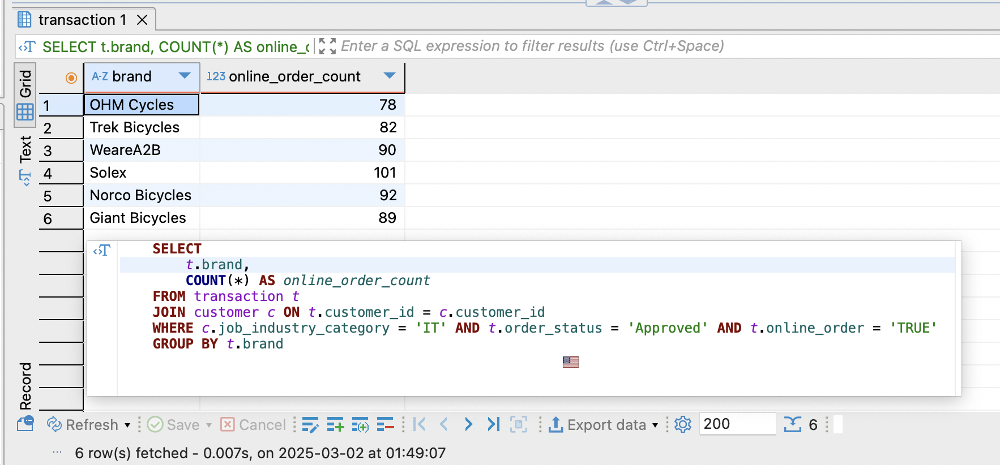

### 4. Найти по всем клиентам сумму всех транзакций (list_price), максимум, минимум и количество транзакций, отсортировав результат по убыванию суммы транзакций и количества клиентов. Выполните двумя способами: используя только group by и используя только оконные функции. Сравните результат. — (2 балла)


#### GROUP BY

In [ ]:
SELECT 
    customer_id,
    SUM(list_price) AS total_transactions,
    MAX(list_price) AS max_transaction,
    MIN(list_price) AS min_transaction,
    COUNT(*) AS transaction_count
FROM transaction
GROUP BY customer_id
ORDER BY total_transactions DESC, transaction_count DESC;


![CleanShot 2025-03-02 at 02.17.58.png](<attachment:CleanShot 2025-03-02 at 02.17.58.png>)
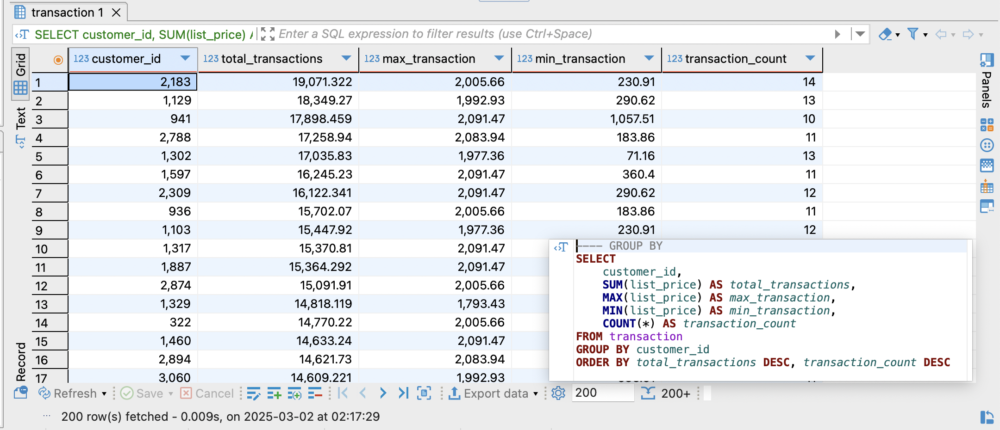

#### Оконные функции

In [ ]:
SELECT 
    customer_id,
    SUM(list_price) OVER (PARTITION BY customer_id) AS total_transactions,
    MAX(list_price) OVER (PARTITION BY customer_id) AS max_transaction,
    MIN(list_price) OVER (PARTITION BY customer_id) AS min_transaction,
    COUNT(*) OVER (PARTITION BY customer_id) AS transaction_count
FROM transaction
ORDER BY total_transactions DESC, transaction_count DESC;

![CleanShot 2025-03-02 at 02.16.47.png](<attachment:CleanShot 2025-03-02 at 02.16.47.png>)
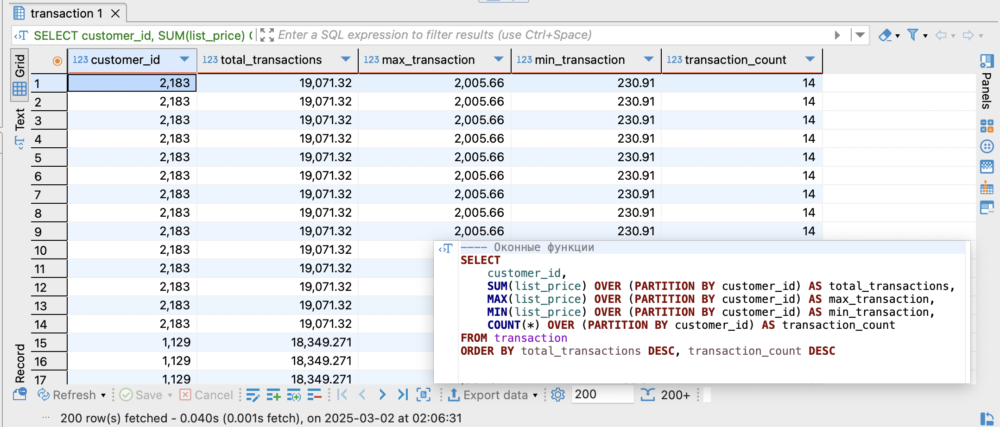

#### Выводы

**GROUP BY**

При использовании `GROUP BY` данные группируются по указанному столбцу (в нашем случае `customer_id`), и для каждой группы вычисляются агрегатные функции (SUM, MAX, MIN, COUNT). В результате мы получили одну строку на каждую группу (каждого клиента), и все агрегатные значения вычисляются для этой группы.

**Оконные функции**

Оконные функции, такие как `SUM OVER`, `MAX OVER`, `MIN OVER`, и `COUNT OVER`, не группируют строки, а вычисляют значения для каждой строки в её "окне" (части набора данных, определённой `PARTITION BY`). Это означает, что каждая строка из исходной таблицы выводится в результатах, и для каждой из них вычисляются агрегатные значения на основе её группы.

**Отличия**

* Количество строк: В случае с GROUP BY мы получаем одну строку на каждого клиента. Оконными функции выводят столько строк, сколько было транзакций для каждого клиента, так как каждая строка сохраняется.

* Повторяющиеся значения: Во втором примере видно, что `total_transactions`, `max_transaction`, `min_transaction`, и `transaction_count` повторяются для каждой строки, соответствующей конкретному клиенту. Так происходит, потому что оконные функции вычисляют значения для каждой строки в группе, но не сокращают количество строк.

### 5. Найти имена и фамилии клиентов с минимальной и максимальной суммой транзакций за весь период (сумма транзакций не может быть null). Напишите отдельные запросы для минимальной и максимальной суммы. — (2 балла)


#### Минимальная сумма транзакций

In [ ]:

SELECT 
    c.first_name,
    c.last_name,
    SUM(t.list_price) AS total_transactions
FROM transaction t
JOIN customer c ON t.customer_id = c.customer_id
GROUP BY c.customer_id
ORDER BY total_transactions ASC
LIMIT 1;


![CleanShot 2025-03-02 at 02.22.44.png](<attachment:CleanShot 2025-03-02 at 02.22.44.png>)
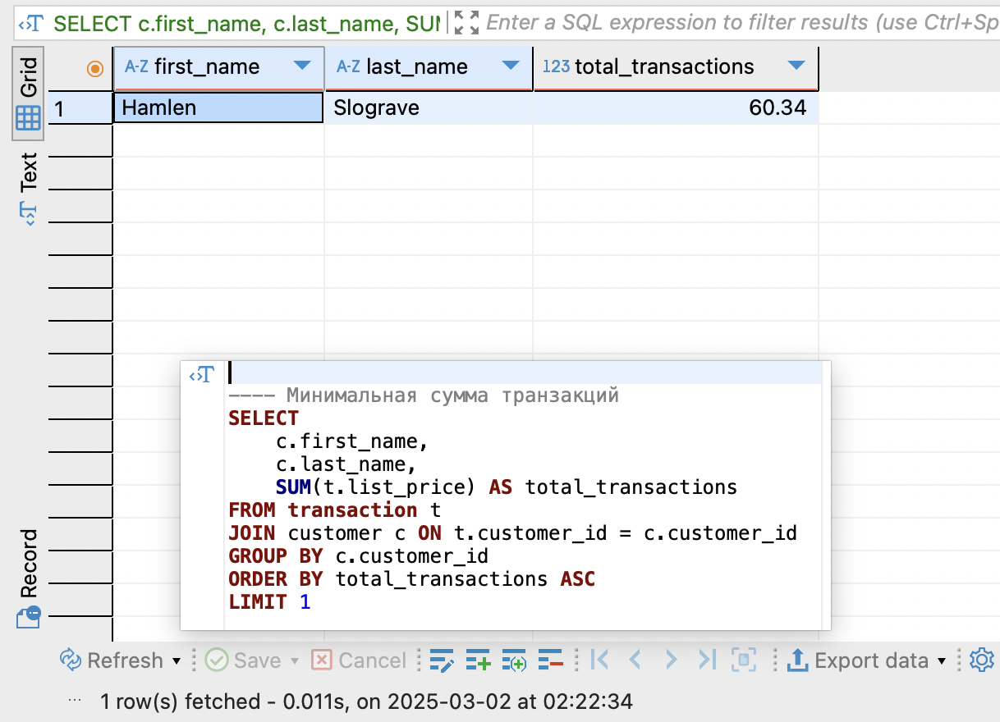

#### Максимальная сумма транзакций

In [ ]:
---- Максимальная сумма транзакций
SELECT 
    c.first_name,
    c.last_name,
    SUM(t.list_price) AS total_transactions
FROM transaction t
JOIN customer c ON t.customer_id = c.customer_id
GROUP BY c.customer_id
ORDER BY total_transactions DESC
LIMIT 1;


![CleanShot 2025-03-02 at 02.25.43.png](<attachment:CleanShot 2025-03-02 at 02.25.43.png>)
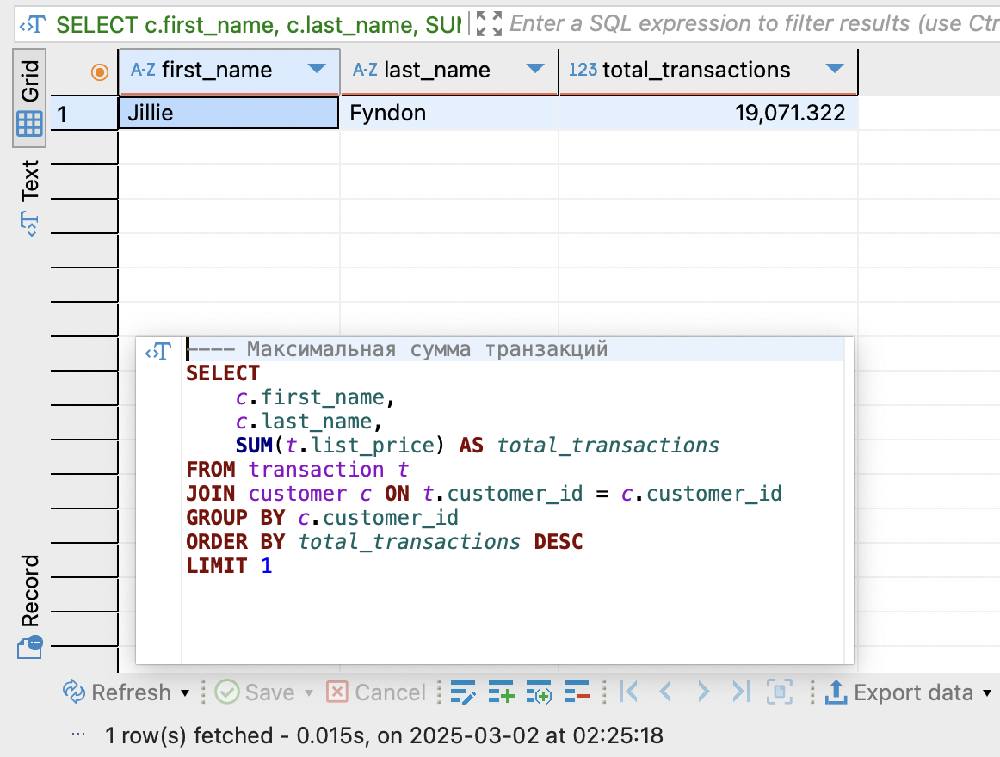

### 6. Вывести только самые первые транзакции клиентов. Решить с помощью оконных функций. — (1 балл)


In [ ]:
SELECT *
FROM (
    SELECT
        *,
        ROW_NUMBER() OVER (PARTITION BY customer_id ORDER BY TO_DATE(transaction_date, 'DD.MM.YYYY')) AS row_number
    FROM transaction
) AS subquery
WHERE row_number = 1;

![CleanShot 2025-03-02 at 02.38.52.png](<attachment:CleanShot 2025-03-02 at 02.38.52.png>)

![CleanShot 2025-03-02 at 02.41.03.png](<attachment:CleanShot 2025-03-02 at 02.41.03.png>)
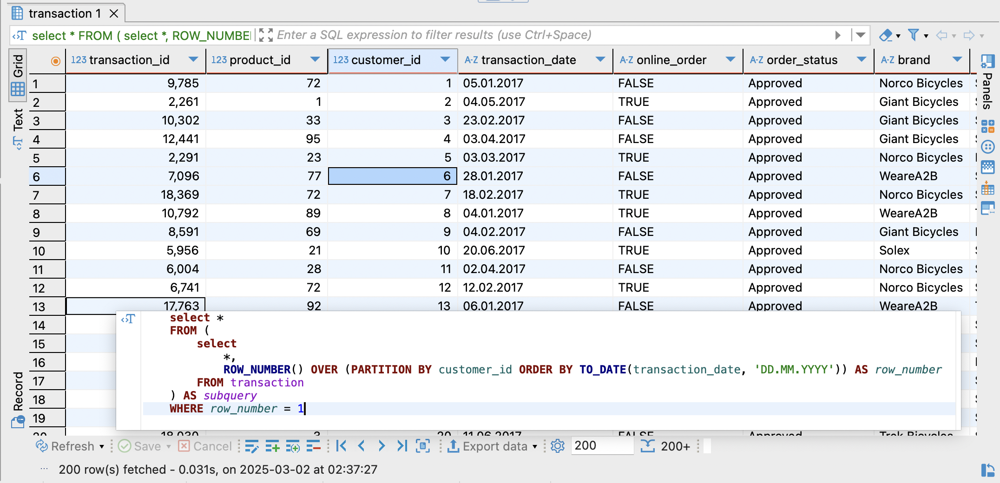
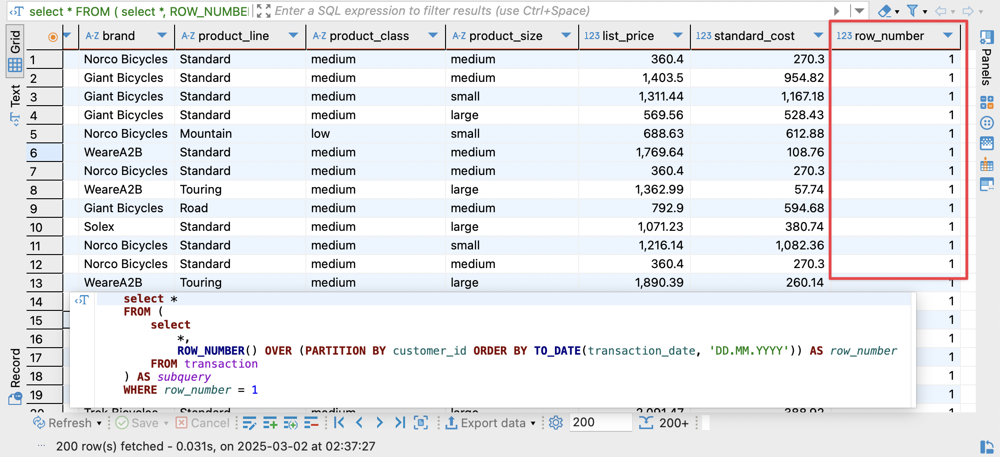

### 7. Вывести имена, фамилии и профессии клиентов, между транзакциями которых был максимальный интервал (интервал вычисляется в днях) — (2 балла)

При решении задачии "в лоб", в выборку попадали пользователи где интевал между операциями был равен `NULL`.
Я нагуглил два варианта решения  данной проблемы:
* Использование `WHERE .. IS NOT NULL`
* Использование `COALESCE`

Результат обоих вариантов оказывался идентичным

 #### Вариант с WHERE

In [ ]:
--- WHERE
/*
 * Включите Wrap text на всякий случай  
 */

	WITH TransactionIntervals AS (
	    SELECT 
	        c.customer_id,
	        c.first_name,
	        c.last_name,
	        c.job_title,
	        TO_DATE(t.transaction_date, 'DD.MM.YYYY') AS transaction_date,
	        LAG(TO_DATE(t.transaction_date, 'DD.MM.YYYY')) OVER (PARTITION BY c.customer_id ORDER BY TO_DATE(t.transaction_date, 'DD.MM.YYYY')) AS prev_transaction_date
	    FROM transaction t
	    JOIN customer c ON t.customer_id = c.customer_id
	)
	SELECT 
	    first_name,
	    last_name,
	    job_title,
	    MAX(transaction_date - prev_transaction_date) AS max_interval
	FROM TransactionIntervals
	/*
	 * нужно для исключения случаев, когда клиент совершил одну транзакцию/
	 * Для них max_interval всегда будет NULL, что искажает результаты.
	 * Если не использовать WHERE ... IS NOT NULL, в выборку попадут даже те, кто сделал покупку вчера, но это была единственная операция
	 */
	WHERE prev_transaction_date IS NOT null
	GROUP BY customer_id, first_name, last_name, job_title
	ORDER BY max_interval DESC
	LIMIT 1;


![CleanShot 2025-03-02 at 03.06.07.png](<attachment:CleanShot 2025-03-02 at 03.06.07.png>)
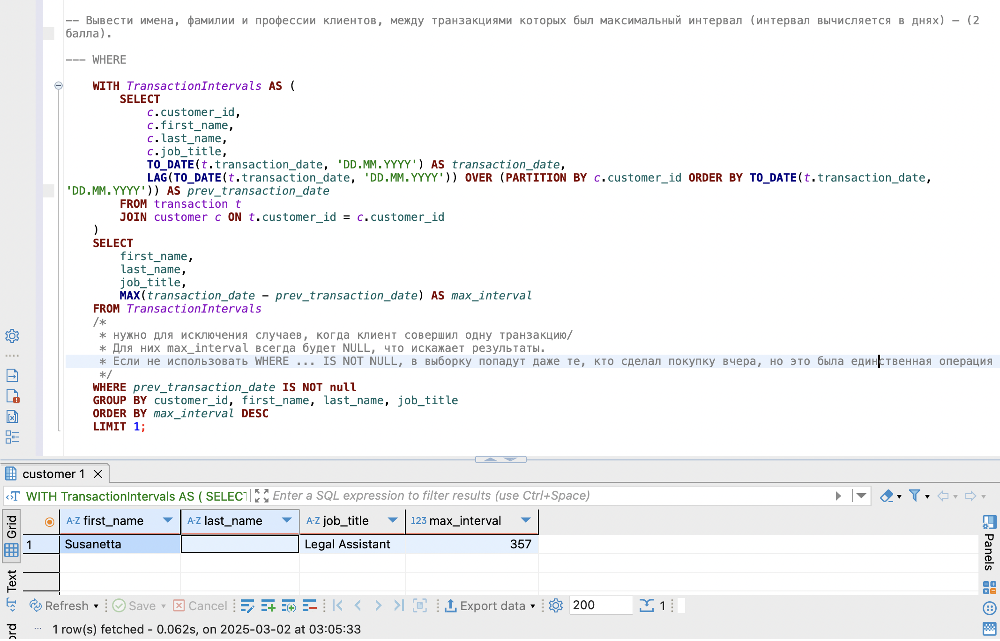

 #### Вариант с COALESCE

In [ ]:
WITH TransactionIntervals AS (
    SELECT 
        c.customer_id,
        c.first_name,
        c.last_name,
        c.job_title,
        TO_DATE(t.transaction_date, 'DD.MM.YYYY') AS transaction_date,
        LAG(TO_DATE(t.transaction_date, 'DD.MM.YYYY')) OVER (PARTITION BY c.customer_id ORDER BY TO_DATE(t.transaction_date, 'DD.MM.YYYY')) AS prev_transaction_date
    FROM transaction t
    JOIN customer c ON t.customer_id = c.customer_id
)
SELECT 
    first_name,
    last_name,
    job_title,
    /*
     * COALESCE нужно для исключения случаев, когда клиент совершил одну транзакцию.
     * Для них max_interval всегда будет NULL, что искажает результаты.
     * Если не использовать COALESCE, в выборку попадут даже те, кто сделал покупку вчера, но это была единственная операция
     */
    MAX(COALESCE(transaction_date - prev_transaction_date, 0)) AS max_interval
FROM TransactionIntervals
GROUP BY customer_id, first_name, last_name, job_title
ORDER BY max_interval DESC
LIMIT 1;


![CleanShot 2025-03-02 at 02.56.21.png](<attachment:CleanShot 2025-03-02 at 02.56.21.png>)
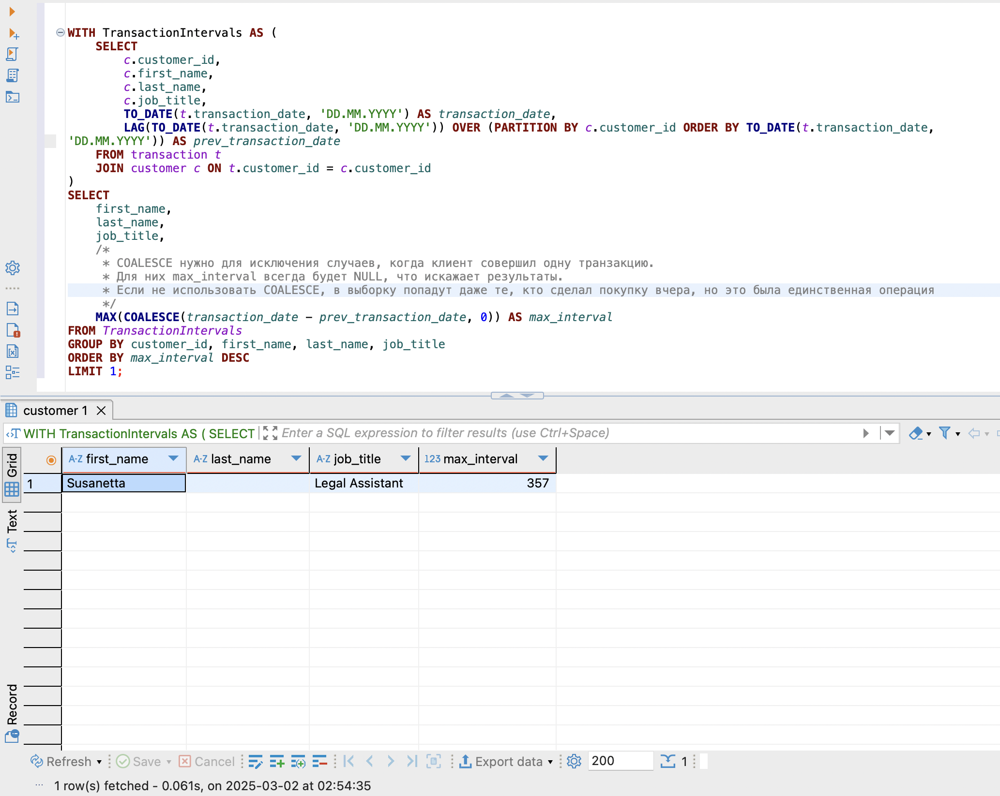